In [1]:
!pip install sidechainnet
!pip install einops

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.6/47.6 MB 3.3 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.7/21.7 MB 3.8 MB/s eta 0:00:0000:0100:01m
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for ProDy: filename=ProDy-2.4.1-cp37-cp37m-linux_x86_64.whl size=22456324 sha256=f48839ee3c15d9e953534287528e46d221d446af3433b8ae680393625691e204
  Stored in directory: /root/.cache/pip/wheels/e7/4c/23/1864b11cdcfef7346d141ae495bf42c4e4ce8f6c66cd5535cd
Successfully built ProDy
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 3.9 MB/s eta 0:00:00


In [2]:
import random
import os
import torch
from torch import nn, einsum

import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import gc

from einops import rearrange, repeat, reduce
from einops.layers.torch import Rearrange
from inspect import isfunction

import sidechainnet as scn
from sidechainnet.examples import losses, models
from sidechainnet.structure.structure import inverse_trig_transform
from sidechainnet.structure.build_info import NUM_ANGLES
import py3Dmol

seed = 0

random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.backends.cudnn.deterministic = True

@> ProDy is configured: verbosity='none'


# Accessing Data via PyTorch Dataloaders
Requesting DataLoaders returns a dictionary mapping split names to DataLoaders. 

In [3]:
# Load the data in the appropriate format for training.
dataloader = scn.load(
             with_pytorch="dataloaders",
             batch_size=4, 
             dynamic_batching=False)
print("Available Dataloaders =", list(dataloader.keys()))

SidechainNet(12, 30) was not found in ./sidechainnet_data.


Downloaded SidechainNet to ./sidechainnet_data/sidechainnet_casp12_30.pkl.
SidechainNet was loaded from ./sidechainnet_data/sidechainnet_casp12_30.pkl.
Available Dataloaders = ['train', 'train-eval', 'test', 'valid-10', 'valid-20', 'valid-30', 'valid-40', 'valid-50', 'valid-70', 'valid-90']


In [4]:
batch = next(iter(dataloader['train']))
print("Protein IDs\n   ", batch.pids)
print("Sequences\n   ", batch.seqs.shape)
print("Evolutionary Data\n   ", batch.evos.shape)
print("Secondary Structure\n   ", batch.secs.shape)
print("Angle Data\n   ", batch.angs.shape)
print("Coordinate Data\n   ", batch.crds.shape)
print("X-ray Resolution\n   ", batch.resolutions)
print("Concatenated Data (seq/evo/2ndary)\n   ", batch.seq_evo_sec.shape)
print("Integer sequence")
print("\tShape:", batch.int_seqs.shape)
print("\tEx:", batch.int_seqs[0,:3])

print("1-hot sequence")
print("\tShape:", batch.seqs.shape)
print("\tEx:\n", batch.seqs[0,:3])

Protein IDs
    ('1H30_d1h30a1', '2JRF_1_A', '2ZF9_1_A', '1JUV_1_A')
Sequences
    torch.Size([4, 194, 20])
Evolutionary Data
    torch.Size([4, 194, 21])
Secondary Structure
    torch.Size([4, 194, 8])
Angle Data
    torch.Size([4, 194, 12])
Coordinate Data
    torch.Size([4, 2716, 3])
X-ray Resolution
    (2.2, None, 1.95, 1.7)
Concatenated Data (seq/evo/2ndary)
    torch.Size([4, 194, 49])
Integer sequence
	Shape: torch.Size([4, 194])
	Ex: tensor([6, 1, 2])
1-hot sequence
	Shape: torch.Size([4, 194, 20])
	Ex:
 tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


In [5]:
# Default integer sequence representation uses the int 20 for padding
# Example: observe the last 15 amino-acid 'characters' of sequence #1
# which has been padded with 20s to match the batch size

example = 0 # 308, note many indices point to structures that have gaps, and thus cannot be visualzed/constructed from angles
seq, ang, crd, mask, sec = ( batch.str_seqs[example],batch.angs[example], 
                             batch.crds[example], batch.msks[example], 
                             batch.secs[example]
                            )
name = batch.pids[example]

print(f"\nExample using {name}.\n")
print(f"Sequence, Mask, and Secondary Structure:\n{seq}\n{mask}\n{sec}\n")
print(f"Angles:\n{ang[:3]} ...\n")
print(f"Coordinates:\n{crd[:3]} ...\n")


Example using 1H30_d1h30a1.

Sequence, Mask, and Secondary Structure:
HCDGRGGLKLSQDMDTCEDILPCVPFSVAKSVKSLYLGRMFSGTPVIRLRFKRLQPTRLVAEFDFRTFDPEGILLFAGGHQDSTWIVLALRAGRLELQLRYNGVGRVTSSGPVINHGMWQTISVEELARNLVIKVNRDAVMKIAVAGDLFQPERGLYHLNLTVGGIPFHEKDLVQPINPRLDGCMRSWNWL
tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0,
        0, 0])
tensor([[0, 0, 0,  ..., 1, 0, 0],
        [0, 0, 0,  ..., 1, 0, 0],
        [0, 0,

In [6]:
#sb = scn.StructureBuilder(seq,crd)
#sb.to_3Dmol(width=600, height=300)

In [7]:
# To train with a GPU, go to Runtime > Change runtime type
if torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
print(f"Using {device} for training.")

Using cuda for training.


# Helper Functions

In [8]:
# helpers

def exists(val):
    return val is not None

def default(val, d):
    if exists(val):
        return val
    return d() if isfunction(d) else d

def cast_tuple(val, depth = 1):
    return val if isinstance(val, tuple) else (val,) * depth

def init_zero_(layer):
    nn.init.constant_(layer.weight, 0.)
    if exists(layer.bias):
        nn.init.constant_(layer.bias, 0.)

# Attention Layer

In [9]:
class Attention(nn.Module):
    def __init__(
        self,
        dim,
        seq_len = None,
        heads = 8,
        dim_head = 64,
        dropout = 0.0,
        gating = True
    ):
        super().__init__()
        inner_dim = dim_head * heads
        self.seq_len = seq_len
        self.heads= heads
        self.scale = dim_head ** -0.5

        self.to_q = nn.Linear(dim, inner_dim, bias = False)
        self.to_kv = nn.Linear(dim, inner_dim * 2, bias = False)
        self.to_out = nn.Linear(inner_dim, dim)

        self.gating = nn.Linear(dim, inner_dim)
        nn.init.constant_(self.gating.weight, 0.)
        nn.init.constant_(self.gating.bias, 1.)

        self.dropout = nn.Dropout(dropout)
        init_zero_(self.to_out)

    def forward(self, x, mask = None, attn_bias = None, context = None, context_mask = None, tie_dim = None):
        device, orig_shape, h, has_context = x.device, x.shape, self.heads, exists(context)
        context = default(context, x)
        q, k, v = (self.to_q(x), *self.to_kv(context).chunk(2, dim = -1))
        i, j = q.shape[-2], k.shape[-2]
        q, k, v = map(lambda t: rearrange(t, 'b n (h d) -> b h n d', h = h), (q, k, v))

        # scale
        q = q * self.scale

        # query / key similarities
        if exists(tie_dim):
            # as in the paper, for the extra MSAs
            # they average the queries along the rows of the MSAs
            # they named this particular module MSAColumnGlobalAttention

            q, k = map(lambda t: rearrange(t, '(b r) ... -> b r ...', r = tie_dim), (q, k))
            q = q.mean(dim = 1)

            dots = einsum('b h i d, b r h j d -> b r h i j', q, k)
            dots = rearrange(dots, 'b r ... -> (b r) ...')
        else:
            dots = einsum('b h i d, b h j d -> b h i j', q, k)

        # add attention bias, if supplied (for pairwise to msa attention communication)
        if exists(attn_bias):
            dots = dots + attn_bias

        # masking
        if exists(mask):
            mask = default(mask, lambda: torch.ones(1, i, device = device).bool())
            context_mask = mask if not has_context else default(context_mask, lambda: torch.ones(1, k.shape[-2], device = device).bool())
            mask_value = -torch.finfo(dots.dtype).max
            mask = mask[:, None, :, None] * context_mask[:, None, None, :]
            try:
                mask = mask.to(torch.bool)
                dots = dots.masked_fill(~mask, mask_value)
            except:
                dots = dots.masked_fill(mask, mask_value)

        # attention
        dots = dots - dots.max(dim = -1, keepdims = True).values
        attn = dots.softmax(dim = -1)
        attn = self.dropout(attn)
        # aggregate
        out = einsum('b h i j, b h j d -> b h i d', attn, v)
        # merge heads
        out = rearrange(out, 'b h n d -> b n (h d)')
        # gating
        gates = self.gating(x)
        out = out * gates.sigmoid()
        # combine to out
        out = self.to_out(out)
        return out

In [10]:
class ProteinNet(nn.Module):
    """A protein sequence-to-angle model that consumes integer-coded sequences."""
    def __init__(self,
                 d_hidden,
                 dim,
                 d_in=21,
                 d_embedding=32,
                 heads = 8,
                 integer_sequence=True,
                 n_angles=scn.structure.build_info.NUM_ANGLES):
        
        super(ProteinNet, self).__init__()
        # Dimensionality of RNN hidden state
        self.d_hidden = d_hidden
      
        self.attn = Attention(dim = dim, heads = heads)
        # Output vector dimensionality (per amino acid)
        self.d_out = n_angles * 2
        # Output projection layer. (from RNN -> target tensor)
        self.hidden2out = nn.Sequential(
                            nn.Linear(d_embedding, d_hidden),
                            nn.GELU(),
                            nn.Linear(d_hidden, self.d_out)
                                    )
        self.out2attn = nn.Linear(self.d_out, dim)
        self.final = nn.Sequential(
                            nn.GELU(),
                            nn.Linear(dim, self.d_out))
        self.norm_0 = nn.LayerNorm([dim])
        self.norm_1 = nn.LayerNorm([dim])
        self.activation_0 = nn.GELU()
        self.activation_1 = nn.GELU()

        # Activation function for the output values (bounds values to [-1, 1])                                  
        self.output_activation = torch.nn.Tanh()

        # We embed our model's input differently depending on the type of input
        self.integer_sequence = integer_sequence
        if self.integer_sequence:
            self.input_embedding = torch.nn.Embedding(d_in, d_embedding, padding_idx=20)
        else:
            self.input_embedding = torch.nn.Linear(d_in, d_embedding)
    def get_lengths(self, sequence):
        """Compute the lengths of each sequence in the batch."""
        if self.integer_sequence:
            lengths = sequence.shape[-1] - (sequence == 20).sum(axis=1)
        else:
            lengths = sequence.shape[1] - (sequence == 0).all(axis=-1).sum(axis=1)
        return lengths.cpu()

    def forward(self, sequence, mask=None):
        """Run one forward step of the model."""
        # First, we compute sequence lengths
        lengths = self.get_lengths(sequence)

        # Next, we embed our input tensors for input to the RNN
        sequence = self.input_embedding(sequence)

        # Then we pass in our data into the RNN via PyTorch's pack_padded_sequences
        sequence = torch.nn.utils.rnn.pack_padded_sequence(sequence,
                                                         lengths,
                                                         batch_first=True,
                                                         enforce_sorted=False)
        output, output_lengths = torch.nn.utils.rnn.pad_packed_sequence(sequence,
                                                                      batch_first=True)
        # At this point, output has the same dimentionality as the RNN's hidden
        # state: i.e. (batch, length, d_hidden). 
      
        # We use a linear transformation to transform our output tensor into the
        # correct dimensionality (batch, length, 24)
        output = self.hidden2out(output)
        output = self.out2attn(output)
        output = self.activation_0(output)
        output = self.norm_0(output)
        output = self.attn(output, mask=mask)
        output = self.activation_1(output)
        output = self.norm_1(output)
        output = self.final(output)
      
        # Next, we need to bound the output values between [-1, 1]
        output = self.output_activation(output)

        # Finally, reshape the output to be (batch, length, angle, (sin/cos val))
        output = output.view(output.shape[0], output.shape[1], 12, 2)

        return output

In [11]:
# Create the model and move it to the GPU
pssms_model = ProteinNet(d_hidden=512,
                           dim=256,
                           d_in=49,
                           d_embedding=32,
                           integer_sequence=False)
pssms_model = pssms_model.to(device)
pssms_model

ProteinNet(
  (attn): Attention(
    (to_q): Linear(in_features=256, out_features=512, bias=False)
    (to_kv): Linear(in_features=256, out_features=1024, bias=False)
    (to_out): Linear(in_features=512, out_features=256, bias=True)
    (gating): Linear(in_features=256, out_features=512, bias=True)
    (dropout): Dropout(p=0.0, inplace=False)
  )
  (hidden2out): Sequential(
    (0): Linear(in_features=32, out_features=512, bias=True)
    (1): GELU()
    (2): Linear(in_features=512, out_features=24, bias=True)
  )
  (out2attn): Linear(in_features=24, out_features=256, bias=True)
  (final): Sequential(
    (0): GELU()
    (1): Linear(in_features=256, out_features=24, bias=True)
  )
  (norm_0): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
  (norm_1): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
  (activation_0): GELU()
  (activation_1): GELU()
  (output_activation): Tanh()
  (input_embedding): Linear(in_features=49, out_features=32, bias=True)
)

In [12]:
def init_loss_optimizer(model):
    optimizer = torch.optim.Adam(model.parameters())
    batch_losses = []
    epoch_training_losses = []
    epoch_validation10_losses = []
    epoch_validation90_losses = []
    mse_loss = torch.nn.MSELoss()
    
    return optimizer, batch_losses, epoch_training_losses, epoch_validation10_losses, epoch_validation90_losses, mse_loss
optimizer, batch_losses, epoch_training_losses, epoch_validation10_losses, epoch_validation90_losses, mse_loss = init_loss_optimizer(pssms_model)

In [13]:
def validation(model, datasplit, mode):
    """Evaluate a model (sequence->sin/cos represented angles [-1,1]) on MSE."""
    total = 0.0
    n = 0
    with torch.no_grad():
        for batch in datasplit:
            # Prepare variables and create a mask of missing angles (padded with zeros)
            # The mask is repeated in the last dimension to match the sin/cos represenation.
            if mode == 'seqs':
                seqs = batch.int_seqs.to(device).long()
            elif mode == 'pssms':
                seqs = batch.seq_evo_sec.to(device)
            mask_ = batch.msks.to(device)
            true_angles_sincosine = scn.structure.trig_transform(batch.angs).to(device)
            mask = (batch.angs.ne(0)).unsqueeze(-1).repeat(1, 1, 1, 2)

            # Make predictions and optimize
            predicted_angles = model(seqs, mask = mask_)
            loss = mse_loss(predicted_angles[mask], true_angles_sincosine[mask])
            
            total += loss
            n += 1

    return torch.sqrt(total/n)

In [14]:
def train(model, mode, n_epoch):
    for epoch in range(n_epoch):
        print(f'Epoch {epoch}')
        progress_bar = tqdm(total=len(dataloader['train']), smoothing=0)
        for batch in dataloader['train']:
            # Prepare variables and create a mask of missing angles (padded with zeros)
            # Note the mask is repeated in the last dimension to match the sin/cos represenation.
            if mode == 'seqs':
                seqs = batch.int_seqs.to(device).long()
            elif mode == 'pssms':
                seqs = batch.seq_evo_sec.to(device)
            mask_ = batch.msks.to(device)
            true_angles_sincos = scn.structure.trig_transform(batch.angs).to(device)
            mask = (batch.angs.ne(0)).unsqueeze(-1).repeat(1, 1, 1, 2)

            # Make predictions and optimize
            predicted_angles = model(seqs, mask = mask_)
            loss = mse_loss(predicted_angles[mask], true_angles_sincos[mask])
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 2)
            optimizer.step()

            # Housekeeping
            batch_losses.append(float(loss))
            progress_bar.update(1)
            progress_bar.set_description(f"\rRMSE Loss = {np.sqrt(float(loss)):.4f}")
        # Evaluate the model's performance on train-eval, downsampled for efficiency
        epoch_training_losses.append(validation(model, dataloader['train-eval'], mode))
        # Evaluate the model's performance on various validation sets
        epoch_validation10_losses.append(validation(model, dataloader['valid-10'], mode))
        epoch_validation90_losses.append(validation(model, dataloader['valid-90'], mode))
        print(f"     Train-eval loss = {epoch_training_losses[-1]:.4f}")
        print(f"     Valid-10   loss = {epoch_validation10_losses[-1]:.4f}")
        print(f"     Valid-90   loss = {epoch_validation90_losses[-1]:.4f}")
    # Finally, evaluate the model on the test set
    print(f"Test loss = {validation(model, dataloader['test'], mode):.4f}")

train(pssms_model, 'pssms', 10)

Epoch 0


  0%|          | 0/6304 [00:00<?, ?it/s]

     Train-eval loss = 0.4627
     Valid-10   loss = 0.4915
     Valid-90   loss = 0.4751
Epoch 1


  0%|          | 0/6304 [00:00<?, ?it/s]

     Train-eval loss = 0.4456
     Valid-10   loss = 0.4832
     Valid-90   loss = 0.4683
Epoch 2


  0%|          | 0/6304 [00:00<?, ?it/s]

     Train-eval loss = 0.4368
     Valid-10   loss = 0.4683
     Valid-90   loss = 0.4561
Epoch 3


  0%|          | 0/6304 [00:00<?, ?it/s]

     Train-eval loss = 0.4352
     Valid-10   loss = 0.4717
     Valid-90   loss = 0.4649
Epoch 4


  0%|          | 0/6304 [00:00<?, ?it/s]

     Train-eval loss = 0.4251
     Valid-10   loss = 0.4737
     Valid-90   loss = 0.4631
Epoch 5


  0%|          | 0/6304 [00:00<?, ?it/s]

     Train-eval loss = 0.4314
     Valid-10   loss = 0.4685
     Valid-90   loss = 0.4519
Epoch 6


  0%|          | 0/6304 [00:00<?, ?it/s]

     Train-eval loss = 0.4420
     Valid-10   loss = 0.5070
     Valid-90   loss = 0.4912
Epoch 7


  0%|          | 0/6304 [00:00<?, ?it/s]

     Train-eval loss = 0.4237
     Valid-10   loss = 0.4594
     Valid-90   loss = 0.4476
Epoch 8


  0%|          | 0/6304 [00:00<?, ?it/s]

     Train-eval loss = 0.4366
     Valid-10   loss = 0.4747
     Valid-90   loss = 0.4624
Epoch 9


  0%|          | 0/6304 [00:00<?, ?it/s]

     Train-eval loss = 0.4403
     Valid-10   loss = 0.4733
     Valid-90   loss = 0.4620
Test loss = 0.4667


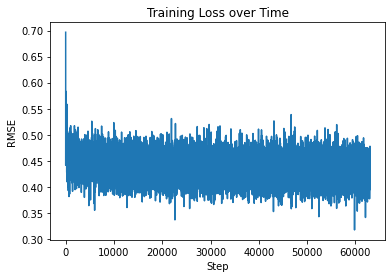

In [15]:
# Plot the loss of each batch over time
plt.plot(np.sqrt(np.asarray(batch_losses)), label='batch loss')
plt.ylabel("RMSE")
plt.xlabel("Step")
plt.title("Training Loss over Time")
plt.show()

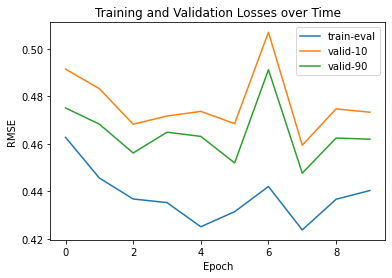

In [16]:
# While the above plot demonstrates each batch's loss during training,
# the plot below shows the performance of the model on several data splits
# at the *end* of each epoch.
plt.plot([x.cpu().detach().numpy() for x in epoch_training_losses], label='train-eval')
plt.plot([x.cpu().detach().numpy() for x in epoch_validation10_losses], label='valid-10')
plt.plot([x.cpu().detach().numpy() for x in epoch_validation90_losses], label='valid-90')
plt.ylabel("RMSE")
plt.xlabel("Epoch")
plt.title("Training and Validation Losses over Time")
plt.legend()
plt.show()

# Visualizing predictions
In most cases, we want to use `scn.BatchedStructureBuilder` which takes as arguments:

1. A tensor (batch x L) of integers representing the protein sequences in the batch. This information is provided while iterating using the given DataLoaders. (See `seq` variable in training loops above.)
2. A tensor (batch x L x NUM_ANGLES) of floating point numbers in $[-\pi, \pi]$ representing the predicted angles for each residue of each amino acid in the protein.

We have a model trained to predict the sin/cos values of a set of angles, simply transform these values into the actual angle tensor (see `scn.structure.inverse_trig_transform`) before providing them to the `BatchedStructureBuilder`.


In [17]:
def build_visualizable_structures(model, data, mode=None):
    """Build visualizable structures for one batch of model's predictions on data."""
    with torch.no_grad():
        for batch in data:
            if mode == "seqs":
                model_input = batch.int_seqs.to(device)
            elif mode == "pssms":
                model_input = batch.seq_evo_sec.to(device)
            mask_ = batch.msks.to(device)
            # Make predictions for angles, and construct 3D atomic coordinates
            predicted_angles_sincos = model(model_input, mask = mask_)
            # Because the model predicts sin/cos values, we use this function to recover the original angles
            predicted_angles = inverse_trig_transform(predicted_angles_sincos)

            # EXAMPLE
            # Use BatchedStructureBuilder to build an entire batch of structures
            sb_pred = scn.BatchedStructureBuilder(batch.int_seqs, predicted_angles.cpu())
            sb_true = scn.BatchedStructureBuilder(batch.int_seqs, batch.crds.cpu())
            break
    return sb_pred, sb_true

In [18]:
def plot_protein(exp1, exp2):
    p = py3Dmol.view(js='https://3dmol.org/build/3Dmol.js', viewergrid=(2,1))
    p.addModel(open(exp1,'r').read(),'pdb', viewer=(0,0))
    p.addModel(open(exp2,'r').read(),'pdb', viewer=(1,0))
    p.setStyle({'cartoon': {'color':'spectrum'}})
    p.zoomTo()
    p.show()

# Inference

In the below visualized examples we compare our model's predicted protein structure with the actual protein structure. For each example the top 3d plot displays model's prediction and bottom plot visualizes the real protein structure.

## Example-1

In [19]:
s_pred, s_true = build_visualizable_structures(pssms_model, dataloader["train"], mode="pssms")
z_idx = 0
idx = 0
s_pred.to_pdb(idx,path='{}_{}_pred.pdb'.format(idx, z_idx))
s_true.to_pdb(idx,path='{}_{}_true.pdb'.format(idx, z_idx))
plot_protein('{}_{}_pred.pdb'.format(idx, z_idx), '{}_{}_true.pdb'.format(idx, z_idx))

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Example-2

In [20]:
idx = 1
s_pred.to_pdb(idx,path='{}_{}_pred.pdb'.format(idx, z_idx))
s_true.to_pdb(idx,path='{}_{}_true.pdb'.format(idx, z_idx))
plot_protein('{}_{}_pred.pdb'.format(idx, z_idx), '{}_{}_true.pdb'.format(idx, z_idx))

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Example-3

In [21]:
idx = 2
s_pred.to_pdb(idx,path='{}_{}_pred.pdb'.format(idx, z_idx))
s_true.to_pdb(idx,path='{}_{}_true.pdb'.format(idx, z_idx))
plot_protein('{}_{}_pred.pdb'.format(idx, z_idx), '{}_{}_true.pdb'.format(idx, z_idx))

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Example - 4

In [22]:
idx = 3
s_pred.to_pdb(idx,path='{}_{}_pred.pdb'.format(idx, z_idx))
s_true.to_pdb(idx,path='{}_{}_true.pdb'.format(idx, z_idx))
plot_protein('{}_{}_pred.pdb'.format(idx, z_idx), '{}_{}_true.pdb'.format(idx, z_idx))

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Example - 5

In [23]:
s_pred, s_true = build_visualizable_structures(pssms_model, dataloader["train"], mode="pssms")
z_idx = 1
idx = 0
s_pred.to_pdb(idx,path='{}_{}_pred.pdb'.format(idx, z_idx))
s_true.to_pdb(idx,path='{}_{}_true.pdb'.format(idx, z_idx))
plot_protein('{}_{}_pred.pdb'.format(idx, z_idx), '{}_{}_true.pdb'.format(idx, z_idx))

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Example - 6

In [24]:
idx = 1
s_pred.to_pdb(idx,path='{}_{}_pred.pdb'.format(idx, z_idx))
s_true.to_pdb(idx,path='{}_{}_true.pdb'.format(idx, z_idx))
plot_protein('{}_{}_pred.pdb'.format(idx, z_idx), '{}_{}_true.pdb'.format(idx, z_idx))

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Example - 7

In [25]:
idx = 2
s_pred.to_pdb(idx,path='{}_{}_pred.pdb'.format(idx, z_idx))
s_true.to_pdb(idx,path='{}_{}_true.pdb'.format(idx, z_idx))
plot_protein('{}_{}_pred.pdb'.format(idx, z_idx), '{}_{}_true.pdb'.format(idx, z_idx))

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Example - 8

In [26]:
idx = 3
s_pred.to_pdb(idx,path='{}_{}_pred.pdb'.format(idx, z_idx))
s_true.to_pdb(idx,path='{}_{}_true.pdb'.format(idx, z_idx))
plot_protein('{}_{}_pred.pdb'.format(idx, z_idx), '{}_{}_true.pdb'.format(idx, z_idx))

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [27]:
seqonly_model = ProteinNet(d_hidden=512,
                           dim=256,
                           d_in=49,
                           d_embedding=32,
                           integer_sequence=True)
seqonly_model = seqonly_model.to(device)
optimizer, batch_losses, epoch_training_losses, epoch_validation10_losses, epoch_validation90_losses, mse_loss = init_loss_optimizer(seqonly_model)
train(seqonly_model, 'seqs', 9)

Epoch 0


  0%|          | 0/6304 [00:00<?, ?it/s]

     Train-eval loss = 0.4518
     Valid-10   loss = 0.4589
     Valid-90   loss = 0.4464
Epoch 1


  0%|          | 0/6304 [00:00<?, ?it/s]

     Train-eval loss = 0.4572
     Valid-10   loss = 0.4633
     Valid-90   loss = 0.4509
Epoch 2


  0%|          | 0/6304 [00:00<?, ?it/s]

     Train-eval loss = 0.4442
     Valid-10   loss = 0.4495
     Valid-90   loss = 0.4404
Epoch 3


  0%|          | 0/6304 [00:00<?, ?it/s]

     Train-eval loss = 0.4551
     Valid-10   loss = 0.4591
     Valid-90   loss = 0.4509
Epoch 4


  0%|          | 0/6304 [00:00<?, ?it/s]

     Train-eval loss = 0.4593
     Valid-10   loss = 0.4652
     Valid-90   loss = 0.4540
Epoch 5


  0%|          | 0/6304 [00:00<?, ?it/s]

     Train-eval loss = 0.4397
     Valid-10   loss = 0.4457
     Valid-90   loss = 0.4359
Epoch 6


  0%|          | 0/6304 [00:00<?, ?it/s]

     Train-eval loss = 0.4477
     Valid-10   loss = 0.4536
     Valid-90   loss = 0.4414
Epoch 7


  0%|          | 0/6304 [00:00<?, ?it/s]

     Train-eval loss = 0.4624
     Valid-10   loss = 0.4657
     Valid-90   loss = 0.4598
Epoch 8


  0%|          | 0/6304 [00:00<?, ?it/s]

     Train-eval loss = 0.4460
     Valid-10   loss = 0.4510
     Valid-90   loss = 0.4403
Test loss = 0.4396


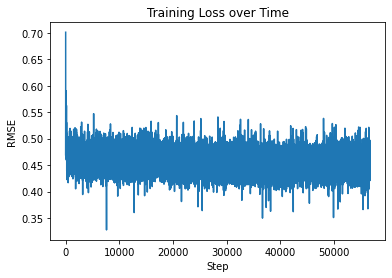

In [28]:
# Plot the loss of each batch over time
plt.plot(np.sqrt(np.asarray(batch_losses)), label='batch loss')
plt.ylabel("RMSE")
plt.xlabel("Step")
plt.title("Training Loss over Time")
plt.show()

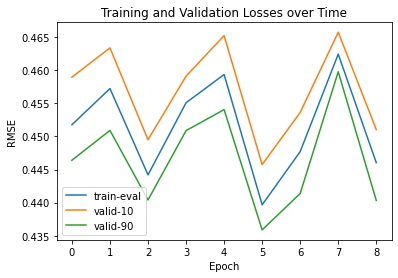

In [29]:
plt.plot([x.cpu().detach().numpy() for x in epoch_training_losses], label='train-eval')
plt.plot([x.cpu().detach().numpy() for x in epoch_validation10_losses], label='valid-10')
plt.plot([x.cpu().detach().numpy() for x in epoch_validation90_losses], label='valid-90')
plt.ylabel("RMSE")
plt.xlabel("Epoch")
plt.title("Training and Validation Losses over Time")
plt.legend()
plt.show()

# Inference (Sequences -> Angles)

## Example - 9

In [30]:
s_pred, s_true = build_visualizable_structures(seqonly_model, dataloader["train"], mode="seqs")
z_idx = 2
idx = 0
s_pred.to_pdb(idx,path='{}_{}_pred.pdb'.format(idx, z_idx))
s_true.to_pdb(idx,path='{}_{}_true.pdb'.format(idx, z_idx))
plot_protein('{}_{}_pred.pdb'.format(idx, z_idx), '{}_{}_true.pdb'.format(idx, z_idx))

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Example - 10

In [31]:
idx = 1
s_pred.to_pdb(idx,path='{}_{}_pred.pdb'.format(idx, z_idx))
s_true.to_pdb(idx,path='{}_{}_true.pdb'.format(idx, z_idx))
plot_protein('{}_{}_pred.pdb'.format(idx, z_idx), '{}_{}_true.pdb'.format(idx, z_idx))

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Example - 11

In [32]:
idx = 2
s_pred.to_pdb(idx,path='{}_{}_pred.pdb'.format(idx, z_idx))
s_true.to_pdb(idx,path='{}_{}_true.pdb'.format(idx, z_idx))
plot_protein('{}_{}_pred.pdb'.format(idx, z_idx), '{}_{}_true.pdb'.format(idx, z_idx))

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Example - 12

In [33]:
idx = 3
s_pred.to_pdb(idx,path='{}_{}_pred.pdb'.format(idx, z_idx))
s_true.to_pdb(idx,path='{}_{}_true.pdb'.format(idx, z_idx))
plot_protein('{}_{}_pred.pdb'.format(idx, z_idx), '{}_{}_true.pdb'.format(idx, z_idx))

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Example - 13

In [34]:
s_pred, s_true = build_visualizable_structures(pssms_model, dataloader["train"], mode="pssms")
z_idx = 3
idx = 0
s_pred.to_pdb(idx,path='{}_{}_pred.pdb'.format(idx, z_idx))
s_true.to_pdb(idx,path='{}_{}_true.pdb'.format(idx, z_idx))
plot_protein('{}_{}_pred.pdb'.format(idx, z_idx), '{}_{}_true.pdb'.format(idx, z_idx))

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Example - 14

In [35]:
idx = 1
s_pred.to_pdb(idx,path='{}_{}_pred.pdb'.format(idx, z_idx))
s_true.to_pdb(idx,path='{}_{}_true.pdb'.format(idx, z_idx))
plot_protein('{}_{}_pred.pdb'.format(idx, z_idx), '{}_{}_true.pdb'.format(idx, z_idx))

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Example - 15

In [36]:
idx = 2
s_pred.to_pdb(idx,path='{}_{}_pred.pdb'.format(idx, z_idx))
s_true.to_pdb(idx,path='{}_{}_true.pdb'.format(idx, z_idx))
plot_protein('{}_{}_pred.pdb'.format(idx, z_idx), '{}_{}_true.pdb'.format(idx, z_idx))

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Example - 16

In [37]:
idx = 3
s_pred.to_pdb(idx,path='{}_{}_pred.pdb'.format(idx, z_idx))
s_true.to_pdb(idx,path='{}_{}_true.pdb'.format(idx, z_idx))
plot_protein('{}_{}_pred.pdb'.format(idx, z_idx), '{}_{}_true.pdb'.format(idx, z_idx))

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol